<a href="https://colab.research.google.com/github/NickKar30/GM-HSE-AI-masters-course/blob/main/homeworks/base/GenDL_HT4_Base.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Домашнее задание 4 (base): авторегрессионные модели и мультимодальность

В этом домашнем задании вам предлагается обучить авторегрессионную модель для генерации изображений (PixelCNN), а также сделать подход мультимодальным,  обусловив модель на CLIP-эмбеддинги.

### Задание 1 (0 баллов)

Скачайте [датасет про птиц с HuggingFace](https://huggingface.co/datasets/weiywang/CUB_200_2011_CAP).

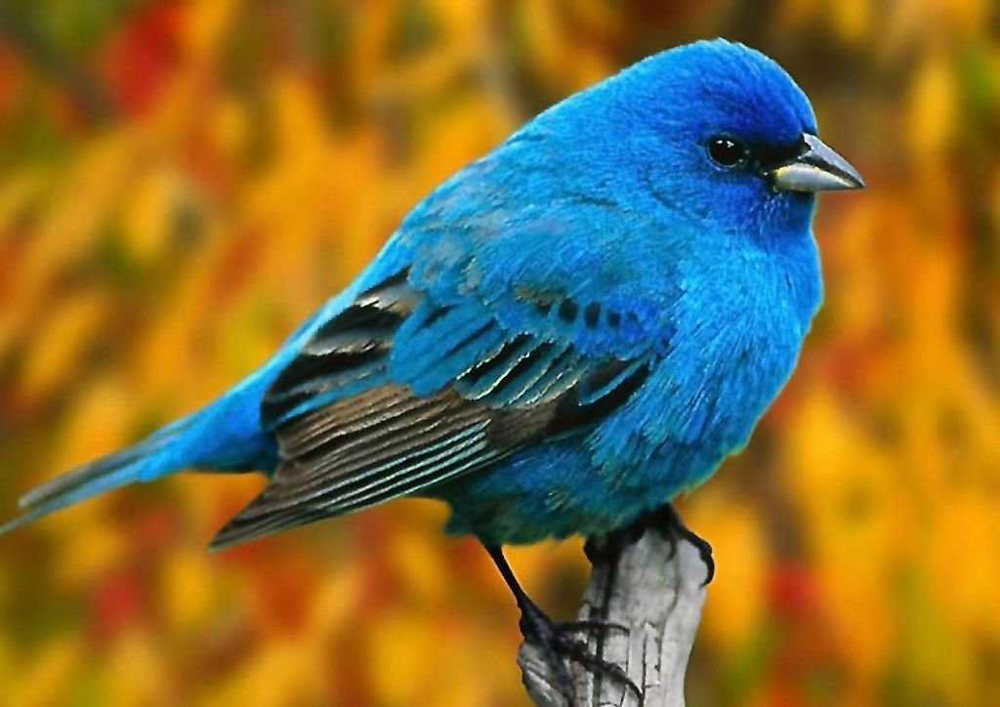

In [1]:
# Загружаем датасет про птиц с HuggingFace
# Обновляем huggingface_hub до версии, совместимой с datasets (содержит HfFolder)
# %pip install "huggingface_hub>=0.20.0,<1.0" --force-reinstall -q

from datasets import load_dataset

dataset = load_dataset("weiywang/CUB_200_2011_CAP")
print(f"Датасет загружен: {dataset}")
print(f"Разделы: {list(dataset.keys())}")
if 'train' in dataset:
    print(f"Размер обучающей выборки: {len(dataset['train'])}")
if 'test' in dataset:
    print(f"Размер тестовой выборки: {len(dataset['test'])}")

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/importlib/__init__.py:90: UserWarning: A NumPy version >=1.22.4 and <2.3.0 is required for this version of SciPy (detected version 2.3.5)
  return _bootstrap._gcd_import(name[level:], package, level)


Датасет загружен: DatasetDict({
    train: Dataset({
        features: ['image', 'text', 'label'],
        num_rows: 11787
    })
})
Разделы: ['train']
Размер обучающей выборки: 11787


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/datasets/table.py:1421: FutureWarning: promote has been superseded by promote_options='default'.
  table = cls._concat_blocks(blocks, axis=0)


### UPD: VQ-VAE

VQ-VAE - это автоэнкодер, который позволяет сжимать большие входные изображения в дискретное латентное пространство (последовательность кодов) и декодировать их обратно (см. рис).

<img src="https://substackcdn.com/image/fetch/$s_!dRiM!,f_auto,q_auto:good,fl_progressive:steep/https%3A%2F%2Fsubstack-post-media.s3.amazonaws.com%2Fpublic%2Fimages%2F81630fcc-b23e-4f06-831f-690aff70e03b_1215x476.png" width="800" height="400">

VQ-VAE состоит из трех частей. Энкодер кодирует входное изображение $x \in \mathbb{R}^{B \times C \times H \times W}$ в непрерывное латентное пространство $z_e \in \mathbb{R}^{B \times D \times H_{h} \times W_{h}}$. Quantizer смотрит на каждый вектор из $z_e$ ($H_{h} \times W_{h}$ штук длины $D$) и заменяет их на ближайший похожий вектор из словаря-векторов (codebook), который обучался вместе с моделью. Сам $z_e$после такой операции заменяется на $z_q$ (те же размеры, но каждый вектор заменен на ближайшего из кодбука). $z_q$ можно хранить либо как непрерывный тензор $\mathbb{R}^{B \times D \times H_{h} \times W_{h}}$, либо просто хранить $B \times  H_{h} \times W_{h}$ дискретных индексов из кодбука, где индексы соответствуют номеру вектора в кодбуке (для примера, если у нас 4096 векторов в кодбуке и мы $z_e$ заменили на вектора на местах $1, 2000, 2, 10$ из кодбука, то теперь $z_q$ в дискретном виде это просто массив $1, 200, 2, 10$). Декодер, последняя часть VQ-VAE, берет $z_q$ и переводит из кодов обратно в вектора из кодбука (если $z_q$ был в виде кодов, а не векторов) и прогоняет $z_q$ через набор слоев, чтобы получить изображение $\hat{x} \simeq x$.


$H_{h} \times W_{h}$ как правило сильно меньше оригинальных $H \times W$, поэтому многие генеративные модели используют VQ-VAE для генерации высококачественных изображений без значительного усложнения вычислительной сложности. Действительно, если вместо авторегрессионной генерации $С \times H \times W$, где $H, W \ge 128$ мы будем работать с дискретным тензором $H_{h} \times W_{h}$, где $H_h, W_h \le 32$, то мы сможем генерировать качественные изображения с той же вычислительной сложностью как если бы сделали resize изначальных картинок в $32\times32$, но при этом не теряем в качестве изображений (ведь финальное изображение получается прогоном кодов через декодер).

Давайте посмотрим как это работает:

In [2]:
import torch

device = 'mps' # "cuda" if torch.cuda.is_available() else "cpu"

In [3]:
# Скачаем предобученную VQ-VAE
import torch

from diffusers import VQModel

vqvae = VQModel.from_pretrained("microsoft/vq-diffusion-ithq", subfolder="vqvae")
vqvae.to(device)

W1125 15:41:45.684000 98904 site-packages/torch/distributed/elastic/multiprocessing/redirects.py:29] NOTE: Redirects are currently not supported in Windows or MacOs.
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/bitsandbytes/cextension.py:34: UserWarning: The installed version of bitsandbytes was compiled without GPU support. 8-bit optimizers, 8-bit multiplication, and GPU quantization are unavailable.
  warn("The installed version of bitsandbytes was compiled without GPU support. "


'NoneType' object has no attribute 'cadam32bit_grad_fp32'


An error occurred while trying to fetch microsoft/vq-diffusion-ithq: microsoft/vq-diffusion-ithq does not appear to have a file named diffusion_pytorch_model.safetensors.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


VQModel(
  (encoder): Encoder(
    (conv_in): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (down_blocks): ModuleList(
      (0): DownEncoderBlock2D(
        (resnets): ModuleList(
          (0-1): 2 x ResnetBlock2D(
            (norm1): GroupNorm(32, 64, eps=1e-06, affine=True)
            (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (norm2): GroupNorm(32, 64, eps=1e-06, affine=True)
            (dropout): Dropout(p=0.0, inplace=False)
            (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (nonlinearity): SiLU()
          )
        )
        (downsamplers): ModuleList(
          (0): Downsample2D(
            (conv): Conv2d(64, 64, kernel_size=(3, 3), stride=(2, 2))
          )
        )
      )
      (1): DownEncoderBlock2D(
        (resnets): ModuleList(
          (0): ResnetBlock2D(
            (norm1): GroupNorm(32, 64, eps=1e-06, affine=True)
            (conv1): Conv2d(64

Скачаем картинку для примера

In [4]:
!wget "https://upload.wikimedia.org/wikipedia/commons/1/16/Myophonus_caeruleus_-_Ang_Khang_edit1.jpg" -O example.jpg

--2025-11-25 15:41:53--  https://upload.wikimedia.org/wikipedia/commons/1/16/Myophonus_caeruleus_-_Ang_Khang_edit1.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 185.15.59.240
Connecting to upload.wikimedia.org (upload.wikimedia.org)|185.15.59.240|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1474949 (1,4M) [image/jpeg]
Saving to: ‘example.jpg’

example.jpg         100%[===================>]   1,41M  3,16MB/s    in 0,4s    

2025-11-25 15:41:53 (3,16 MB/s) - ‘example.jpg’ saved [1474949/1474949]



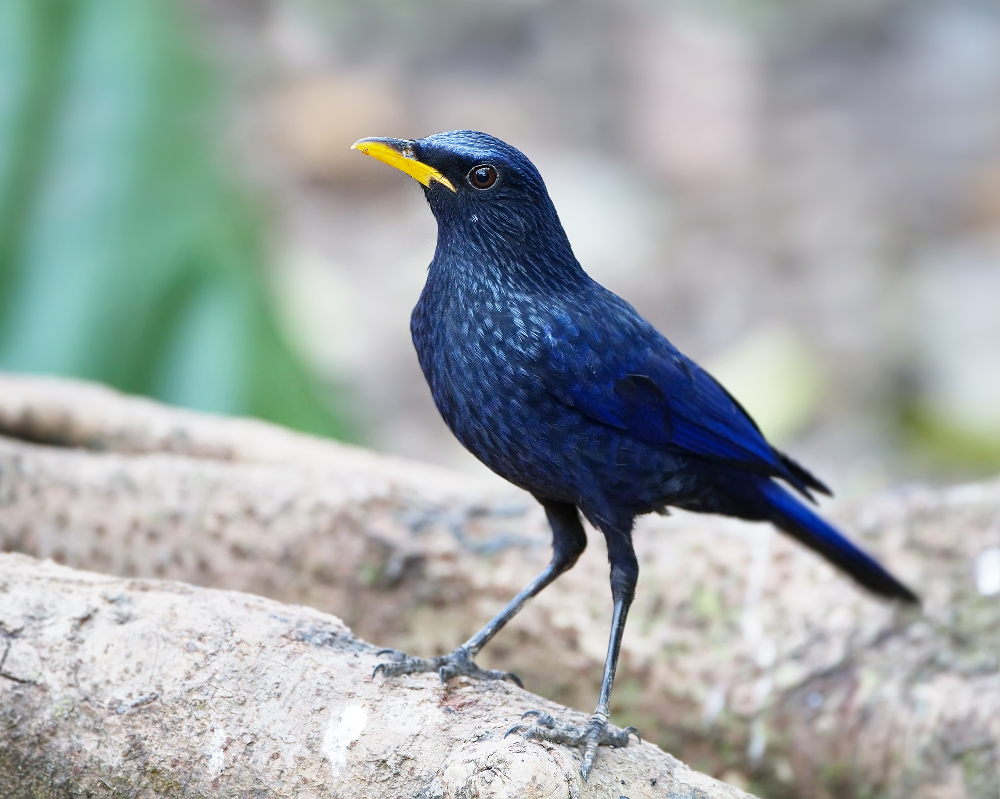

In [6]:
from PIL import Image

img = Image.open("example.jpg")
img

VQ-VAE этот работает на изображениях $256\times 256$, поэтому ресайзим

In [7]:
from torchvision import transforms

x = transforms.Resize((256, 256))(img)
x = transforms.ToTensor()(x)
x.shape

torch.Size([3, 256, 256])

Код для получения кодов и декодирования изображения:

In [8]:
def img_to_codes(x, vqvae):
    '''
    преобразование изображения в дискретные коды
    '''
    # доб batch размерность в начало
    if x.ndim != 4:
        x = x.unsqueeze(0)
    # для нормализации вход не [0, 1], а [-1, 1]
    x = x * 2 - 1
    # применяем энкодер
    latent = vqvae.encode(x).latents
    # получаем z_q и соответствующие коды
    quant, commit_loss, (_, _, indices) = vqvae.quantize(latent)
    # коды тут flatten, решейпим обратно
    B, _, Hc, Wc = latent.shape
    if indices.dim() == 1:
        codes = indices.view(B, Hc, Wc)
    else:
        codes = indices
    return codes

def codes_to_img(codes, vqvae):
    '''
    из кодов в изображение
    '''
    B, Hc, Wc = codes.shape
    # все элементы в один вектор
    codes = codes.view(-1)
    # получаем непрерывное z_q из соответствующих кодов,
    # смотря на вектора из кодбука по индексам
    quant = vqvae.quantize.get_codebook_entry(
        codes,
        shape=(B, Hc, Wc, vqvae.quantize.vq_embed_dim)  # (B, H, W, C)
    )
    # декодируем
    quant2 = vqvae.post_quant_conv(quant)
    dec = vqvae.decoder(quant2, quant if vqvae.config.norm_type == "spatial" else None)
    return (dec + 1) / 2

Применим:

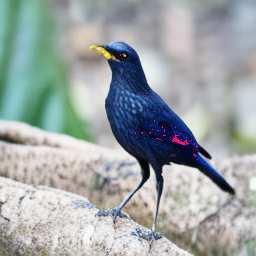

In [9]:
codes = img_to_codes(x.to(device), vqvae)
hat_x = codes_to_img(codes, vqvae)
transforms.ToPILImage()(hat_x[0])

In [14]:
codes

tensor([[[ 817, 2035, 1131,  ..., 2121, 3251,  308],
         [ 959, 3175, 3348,  ...,  798,  890,  626],
         [4008,  485, 1446,  ...,  300, 2945,  113],
         ...,
         [1287, 3999, 2154,  ..., 1070, 2207, 1166],
         [3132, 4010,  896,  ...,  729, 2359, 3617],
         [1282, 1434, 3435,  ...,  312,  109, 1547]]], device='mps:0')

Видим, что у нас получилось довольно хорошо восстановить изображения из кодов. Но какие размеры у `codes`?

In [15]:
codes.shape

torch.Size([1, 32, 32])

$B=1$, т.е. вместо $3\times 256\times 256$ (RGB) мы получаем всего лишь $32\times 32$.

Раньше, дискретных значений было в одном пикселе было $3 \cdot 256$ (цвета в RGB по каждому каналу). Теперь кол-во дискретных значения задается количеством кодов в кодбуке vqvae $N_q$

In [16]:
vqvae.config.num_vq_embeddings

4096

Как и прежде, мы можем генерировать подобные дискретные тензоры авторегрессионно с помощью PixelCNN, но если раньше мы работали в пространстве изображений, то теперь будем работать в латентном. Как и раньше, мы будем считать, что $32\times32$ тензор это последовательность токенов со значениями из $[0, N_q-1]$, которую мы считываем построчно слево направо. Наш PixelCNN, как и раньше, будет смотреть только на предыдущие токены, чтобы генерировать новый. Модель каждый шаг будет предсказывать вероятностное распределение на словаре: $[0, N_q-1]$

То есть, все буквально, как и раньше, но вместо RGB изображений, мы будем генерировать `codes`. Чтобы получить RGB, мы просто прокинем codes через декодер VQ-VAE и получим RGB изображений в высоком разрешении.

P.S. Поскольку VQ-VAE сильно сжимает изображение, мы заодно избавляемся от высокочастотного шума, который присутствует в цветных натуральных изображениях и мешает авторегрессионным генераторам делать хорошую генерацию. В изначальной версии ДЗ PixelCNN могло получить хороший bpd, но генерировало RGB шум из-за слишком разнообразного фона на картинках птиц. VQ-VAE, засчет сжатия, делает каждый токен очень значимым (нет двух соседних токенов, которые по сути отвечают лишь за две соседние маленькие точки фона, мешая PixelCNN обучиться). Действительно, если изначально картинка была с стороной 256, а стала с 32 в  `codes`, то каждый токен отвечает за участок размера $8\times8$, что куда более значимо, чем один пиксель в исходном изображении. Можно было бы сказать, что такого же эффекта "значимости" можно было бы добиться просто resize в $32\times 32$ RGB картинки, но PixelCNN путался бы из-за цветов (3 канала в RGB, в `codes` нет каналов), а также сами пиксели имели бы лишь поверхностное значение. В VQ-VAE токены смоделированы специально для сжатия и восстановления обратно в $256\times 256$, поэтому каждый токен содержит в себе более глубокую и детальную информацию, чем просто resize-нутый пиксель.

### Задание 2 (1 балл).

Скачайте любую версию предобученного CLIP на ваш вкус, примените текстовый кодировщик к описаниям птиц из датасета (столбец "text") и сохраните получившиеся эмбеддинги.

Возьмите из датасета две картинки с визуально похожими птицами и посчитайте косинусную близость эмбеддингов подписей к этим фото, оцените корректность результата.

In [10]:
dataset['train']['text'][:3]

['a bird with big eyes and brown tones all over. white underbelly and pointed beaka very small bird whose entire coat is covered with varying shades of green.this bird is brown with white on its chest and has a very short beak.this small bird has grey wingbars with a white belly.this light brown and yellow bird features large black eyes and a small beak.small grey green and brown bird with medium black tarsus and medium beakthis bird has wings that are green and black and has a white bodythis bird has wings that are black and white and has a green headthis bird has wings that are grey and has a white bellythis bird is brown and white in color, and has a brown beak.',
 'the bird has small beak when compared to its body, with gray and white wingbars.this bird has a white belly and breast, with a gray crown and white wingbars.the bird is grey with a round head and a black short beak.the side and belly seem to be different shades of green and black.this small gray bird has white wingbars, 

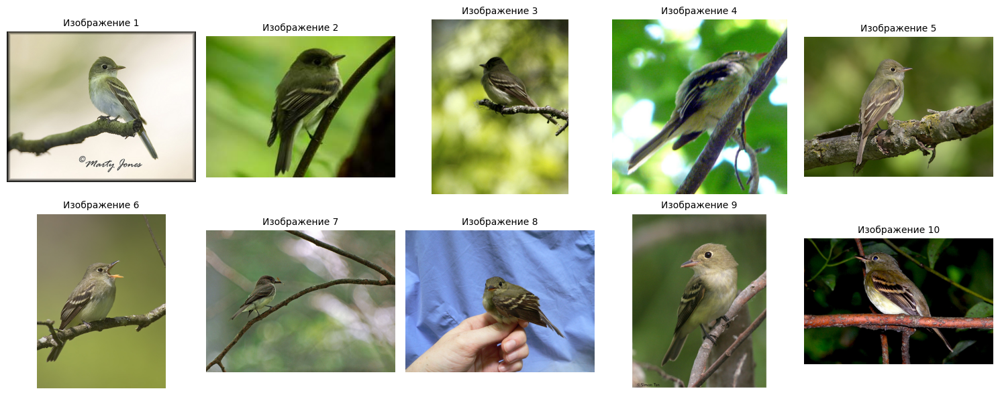

In [11]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 5, figsize=(15, 6))
axes = axes.flatten()

for i in range(10):
    image = dataset['train']['image'][i]
    axes[i].imshow(image)
    axes[i].axis('off')
    axes[i].set_title(f'Изображение {i+1}', fontsize=10)

plt.tight_layout()
plt.show()

У 2 и 3 изображения птицы очень похожи

In [ ]:
import torch.nn.functional as F
from transformers import CLIPProcessor, CLIPModel
import matplotlib.pyplot as plt

# Загружаем предобученный CLIP
clip_model_name = "openai/clip-vit-base-patch32"
clip_model = CLIPModel.from_pretrained(clip_model_name)
clip_processor = CLIPProcessor.from_pretrained(clip_model_name)
clip_model.to(device)
clip_model.eval()

print(f"CLIP модель загружена: {clip_model_name}")

# ============ Вычисление текстовых эмбеддингов для всего датасета ============
# Получаем текстовые описания из датасета
texts = list(dataset['train']['text'])
print(f"Всего текстовых описаний: {len(texts)}")

# Применяем текстовый кодировщик батчами для экономии памяти
print("Кодируем текстовые описания...")
batch_size = 256
all_text_embeddings = []

for i in range(0, len(texts), batch_size):
    batch_texts = texts[i:i + batch_size]
    text_inputs = clip_processor(text=batch_texts, return_tensors="pt", padding=True, truncation=True, max_length=77)
    with torch.no_grad():
        batch_embeddings = clip_model.get_text_features(**text_inputs.to(device))
        batch_embeddings = F.normalize(batch_embeddings, p=2, dim=1)
        all_text_embeddings.append(batch_embeddings.cpu())
    
    if (i // batch_size) % 10 == 0:
        print(f"  Обработано {min(i + batch_size, len(texts))}/{len(texts)} текстов...")

text_embeddings = torch.cat(all_text_embeddings, dim=0).to(device)
del all_text_embeddings
torch.cuda.empty_cache()

print(f"Размерность текстовых эмбеддингов: {text_embeddings.shape}")

# ============ Косинусная близость между текстовыми эмбеддингами изображений 1 и 2 ============
# Используем уже вычисленные text_embeddings для индексов 1 и 2
text_emb_1 = text_embeddings[1]  # Эмбеддинг текста для изображения 1
text_emb_2 = text_embeddings[2]  # Эмбеддинг текста для изображения 2

# Вычисляем косинусную близость между текстовыми эмбеддингами
# Косинусная близость = скалярное произведение нормализованных векторов
cosine_similarity = torch.matmul(text_emb_1, text_emb_2).item()

print(f"\nКосинусная близость между текстовыми эмбеддингами изображений 1 и 2: {cosine_similarity:.4f}")
print(f"\nТекст 1: {texts[1]}")
print(f"Текст 2: {texts[2]}")

# Визуализация результатов
image_1 = dataset['train']['image'][1]
image_2 = dataset['train']['image'][2]

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Изображение 1
axes[0].imshow(image_1)
axes[0].axis('off')
axes[0].set_title(f'Изображение 1\n{texts[1][:50]}...', fontsize=10)

# Изображение 2
axes[1].imshow(image_2)
axes[1].axis('off')
axes[1].set_title(f'Изображение 2\n{texts[2][:50]}...', fontsize=10)

plt.suptitle(f'Косинусная близость (по текстам): {cosine_similarity:.4f}', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()


config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

CLIP модель загружена: openai/clip-vit-base-patch32
Всего текстовых описаний: 11787
Кодируем текстовые описания...


RuntimeError: MPS backend out of memory (MPS allocated: 22.38 GiB, other allocations: 2.09 GiB, max allowed: 27.20 GiB). Tried to allocate 6.92 GiB on private pool. Use PYTORCH_MPS_HIGH_WATERMARK_RATIO=0.0 to disable upper limit for memory allocations (may cause system failure).

### Задание 3 (0.5 балла).

Соберите картинки и получившиеся эмбеддинги в датасеты. Сохраните два датасета: один только с изображениями, другой - с изображениями и эмбеддингами подписей.

- Сконвертируйте картинки в соответствующие `codes` (используйте функции выше)

Hint: внимательно посмотрите на кол-во каналов в изображениях датасета и размеры картинок, предобработайте картинки перед подачей в VQ-VAE

Hint 2: сначала используется сабсет из вашего датасета для дебага, потому что датасет конвертируется долго, после дебага используйте весь

In [ ]:
from torchvision import transforms
from tqdm import tqdm
from datasets import Dataset
import numpy as np

# Трансформации для подготовки изображений к VQ-VAE
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
])

def preprocess_image(img):
    """Предобработка изображения: resize и конвертация в RGB если нужно"""
    # Конвертируем в RGB если изображение не RGB (например grayscale или RGBA)
    if img.mode != 'RGB':
        img = img.convert('RGB')
    return transform(img)

# Сначала используем небольшой subset для дебага
DEBUG = False  # Поменяйте на False для полного датасета
subset_size = 100 if DEBUG else len(dataset['train'])

print(f"Обрабатываем {subset_size} изображений...")

# Собираем коды для всех изображений
all_codes = []
batch_size = 32  # Обрабатываем батчами для эффективности

for i in tqdm(range(0, subset_size, batch_size), desc="Кодируем изображения"):
    batch_end = min(i + batch_size, subset_size)
    batch_images = []
    
    for j in range(i, batch_end):
        img = dataset['train']['image'][j]
        img_tensor = preprocess_image(img)
        batch_images.append(img_tensor)
    
    # Собираем в батч
    batch_tensor = torch.stack(batch_images).to(device)
    
    # Получаем коды через VQ-VAE
    with torch.no_grad():
        codes = img_to_codes(batch_tensor, vqvae)
    
    all_codes.append(codes.cpu())

# Объединяем все коды
all_codes = torch.cat(all_codes, dim=0)
print(f"Размер всех кодов: {all_codes.shape}")

# Получаем соответствующие текстовые эмбеддинги (если они уже вычислены)
# text_embeddings должны быть вычислены в предыдущей ячейке
subset_text_embeddings = text_embeddings[:subset_size].cpu().numpy()

# Создаем датасет только с кодами (изображениями)
dataset_codes_only = Dataset.from_dict({
    'codes': [codes.numpy() for codes in all_codes],
})
print(f"Датасет только с кодами: {dataset_codes_only}")

# Создаем датасет с кодами и текстовыми эмбеддингами
dataset_codes_with_embeddings = Dataset.from_dict({
    'codes': [codes.numpy() for codes in all_codes],
    'text_embedding': [emb for emb in subset_text_embeddings],
})
print(f"Датасет с кодами и эмбеддингами: {dataset_codes_with_embeddings}")

# Сохраняем датасеты на диск (опционально)
# dataset_codes_only.save_to_disk('dataset_codes_only')
# dataset_codes_with_embeddings.save_to_disk('dataset_codes_with_embeddings')

print("\nДатасеты созданы!")
print(f"Пример кодов shape: {np.array(dataset_codes_only[0]['codes']).shape}")
print(f"Пример эмбеддинга shape: {np.array(dataset_codes_with_embeddings[0]['text_embedding']).shape}")

### Задание 4 (2 балла).

- Обучите [модель из семинара (PixelCNN)](https://colab.research.google.com/drive/1EIsBxlTcz3ZB0j-ZxN1gWD2dSQq6krPj?usp=sharing) только на `codes` птиц. Модифицируйте размерности тензоров в модели, где это необходимо - чтобы она корректно работала с данными изображениями (обратите внимание на то, какие дискретные числа должны предсказывать ваша модель)

- Сделайте обучаемый `nn.Embedding` для `codes` перед подачей в слои свертки

- Вы можете менять гиперпараметры для улучшения качества генерации

- Выведите на экран 10 сгенерированных картинок, оцените результат, напишите выводы

Hint: добавьте конвертацию кодов в изображения в функцию отрисовки картинок, а не в `sample`.

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from tqdm import tqdm
import matplotlib.pyplot as plt
import numpy as np

# Количество кодов в VQ-VAE кодбуке
NUM_CODES = vqvae.config.num_vq_embeddings  # 4096

class MaskedConvolution(nn.Module):

    def __init__(self, c_in, c_out, mask, **kwargs):
        """
        Implements a convolution with mask applied on its weights.
        Inputs:
            c_in - Number of input channels
            c_out - Number of output channels
            mask - Tensor of shape [kernel_size_H, kernel_size_W] with 0s where
                   the convolution should be masked, and 1s otherwise.
            kwargs - Additional arguments for the convolution
        """
        super().__init__()
        # For simplicity: calculate padding automatically
        kernel_size = (mask.shape[0], mask.shape[1])
        dilation = 1 if "dilation" not in kwargs else kwargs["dilation"]
        padding = tuple([dilation*(kernel_size[i]-1)//2 for i in range(2)])
        # Actual convolution
        self.conv = nn.Conv2d(c_in, c_out, kernel_size, padding=padding, **kwargs)

        # Mask as buffer => it is no parameter but still a tensor of the module
        # (must be moved with the devices)
        self.register_buffer('mask', mask[None,None])

    def forward(self, x):
        self.conv.weight.data *= self.mask # Ensures zero's at masked positions
        return self.conv(x)


class VerticalStackConvolution(MaskedConvolution):

    def __init__(self, c_in, c_out, kernel_size=3, mask_center=False, **kwargs):
       # Создаётся квадратная матрица из единиц (kernel_size × kernel_size), которая будет маской.
       # Все элементы ниже центральной строки зануляются (=0) → это значит, что фильтр не может смотреть вниз
       # (т.е. на пиксели ниже текущего).
        mask = torch.ones(kernel_size, kernel_size)
        mask[kernel_size//2+1:,:] = 0

       # Если mask_center=True, то обнуляется центральная строка, то есть пиксель не видит даже себя самого.
       # Это используется при самой первой свёртке, чтобы не допустить "подглядывания" текущего значения.
        if mask_center:
            mask[kernel_size//2,:] = 0

        super().__init__(c_in, c_out, mask, **kwargs)

class HorizontalStackConvolution(MaskedConvolution):

    def __init__(self, c_in, c_out, kernel_size=3, mask_center=False, **kwargs):
        mask = torch.ones(1,kernel_size)
        mask[0,kernel_size//2+1:] = 0

        if mask_center:
            mask[0,kernel_size//2] = 0

        super().__init__(c_in, c_out, mask, **kwargs)


class GatedMaskedConv(nn.Module):

    def __init__(self, c_in, **kwargs):
        """
        Gated Convolution block implemented the computation graph shown above.
        """
        super().__init__()
        self.conv_vert = VerticalStackConvolution(c_in, c_out=2*c_in, **kwargs)
        self.conv_horiz = HorizontalStackConvolution(c_in, c_out=2*c_in, **kwargs)
        self.conv_vert_to_horiz = nn.Conv2d(2*c_in, 2*c_in, kernel_size=1, padding=0)
        self.conv_horiz_1x1 = nn.Conv2d(c_in, c_in, kernel_size=1, padding=0)

    def forward(self, v_stack, h_stack):
        # Vertical stack (left)
        v_stack_feat = self.conv_vert(v_stack)
        v_val, v_gate = v_stack_feat.chunk(2, dim=1)
        v_stack_out = torch.tanh(v_val) * torch.sigmoid(v_gate)

        # Horizontal stack (right)
        h_stack_feat = self.conv_horiz(h_stack)
        h_stack_feat = h_stack_feat + self.conv_vert_to_horiz(v_stack_feat)
        h_val, h_gate = h_stack_feat.chunk(2, dim=1)
        h_stack_feat = torch.tanh(h_val) * torch.sigmoid(h_gate)
        h_stack_out = self.conv_horiz_1x1(h_stack_feat)
        h_stack_out = h_stack_out + h_stack

        return v_stack_out, h_stack_out


# ============ PixelCNN адаптированный для VQ-VAE кодов ============
# Изменения относительно оригинала:
# 1. Добавлен nn.Embedding для преобразования дискретных кодов в эмбеддинги
# 2. Вход: (B, H, W) вместо (B, C, H, W) - коды без каналов
# 3. Выход: num_codes классов вместо c_in * 256
# 4. sample() без цикла по каналам

class PixelCNN(nn.Module):

    def __init__(self, c_in, c_hidden, num_codes=4096):
        super().__init__()
        self.c_in = c_in
        self.c_hidden = c_hidden
        self.num_codes = num_codes

        # + embed для дискретных кодов
        self.embedding = nn.Embedding(num_codes, c_in)

        # Initial convolutions skipping the center pixel
        self.conv_vstack = VerticalStackConvolution(c_in, c_hidden, mask_center=True)
        self.conv_hstack = HorizontalStackConvolution(c_in, c_hidden, mask_center=True)
        # Convolution block of PixelCNN. We use dilation instead of downscaling
        self.conv_layers = nn.ModuleList([
            GatedMaskedConv(c_hidden),
            GatedMaskedConv(c_hidden, dilation=2),
            GatedMaskedConv(c_hidden),
            GatedMaskedConv(c_hidden, dilation=4),
            GatedMaskedConv(c_hidden),
            GatedMaskedConv(c_hidden, dilation=2),
            GatedMaskedConv(c_hidden)
        ])
        # Output classification convolution (1x1)

        # кол-во кодов (num_codes) вместо c_in * 256
        self.conv_out = nn.Conv2d(c_hidden, num_codes, kernel_size=1, padding=0)

    def forward(self, x):
        """
        Forward image through model and return logits for each pixel.
        Inputs:
            x - Codes tensor (B, H, W)
        """
        # embed вместо нормализации
        # (B, H, W) -> (B, H, W, c_in) -> (B, c_in, H, W)
        x = self.embedding(x).permute(0, 3, 1, 2)

        # Initial convolutions
        v_stack = self.conv_vstack(x)
        h_stack = self.conv_hstack(x)
        # Gated Convolutions
        for layer in self.conv_layers:
            v_stack, h_stack = layer(v_stack, h_stack)
        # 1x1 classification convolution
        # Apply ELU before 1x1 convolution for non-linearity on residual connection
        out = self.conv_out(F.elu(h_stack))

        # выход - (B, num_codes, H, W)
        return out

    def calc_likelihood(self, x):
        # Forward pass with bpd likelihood calculation
        pred = self.forward(x)
        nll = F.cross_entropy(pred, x, reduction='none')
        bpd = nll.mean(dim=[1,2]) * np.log2(np.exp(1))
        return bpd.mean()

    @torch.no_grad()
    def sample(self, img_shape, img=None):
        """
        Sampling function for the autoregressive model.
        Inputs:
            img_shape - Shape of the image to generate (B,H,W)
            img (optional) - If given, this tensor will be used as
                             a starting image. The pixels to fill
                             should be -1 in the input tensor.
        """
        # Create empty image
        # инициализируем нулями
        if img is None:
            img = torch.zeros(img_shape, dtype=torch.long).to(device)
        # Generation loop
        # без цикла по каналам
        for h in tqdm(range(img_shape[1]), leave=False):
            for w in range(img_shape[2]):
                pred = self.forward(img)
                probs = F.softmax(pred[:,:,h,w], dim=-1)
                img[:,h,w] = torch.multinomial(probs, num_samples=1).squeeze(dim=-1)
        return img

# иниц модели
model_pixelcnn = PixelCNN(c_in=128, c_hidden=128, num_codes=NUM_CODES).to(device)

# подготовка данных
train_codes = torch.tensor(np.array([np.array(x['codes']) for x in dataset_codes]), dtype=torch.long)

# DataLoader
from torch.utils.data import TensorDataset, DataLoader
train_dataset = TensorDataset(train_codes)
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)

# Обучение
optimizer = optim.Adam(model_pixelcnn.parameters(), lr=1e-3)
scheduler = optim.lr_scheduler.StepLR(optimizer, 1, gamma=0.99)

num_epochs = 100  
losses = []

print("обучение")
for epoch in range(num_epochs):
    model_pixelcnn.train()
    epoch_loss = 0
    
    for batch in train_loader:
        codes_batch = batch[0].to(device)
        
        optimizer.zero_grad()
        loss = model_pixelcnn.calc_likelihood(codes_batch)
        loss.backward()
        optimizer.step()
        
        epoch_loss += loss.item()
    
    scheduler.step()
    avg_loss = epoch_loss / len(train_loader)
    losses.append(avg_loss)
    
    if (epoch + 1) % 5 == 0:
        print(f"Epoch {epoch+1}/{num_epochs}, BPD: {avg_loss:.4f}")

# график обучения
plt.figure(figsize=(10, 4))
plt.plot(losses)
plt.xlabel('epoch')
plt.ylabel('BPD')
plt.title('train Loss')
plt.grid(True)
plt.show()

### Задание 5 (3.5 балла).

- Добавьте сохраненные эмбеддинги подписей к архитектуре PixelCNN (это можно сделать любым способом - прибавить эмбеддинги, сконкатенировать их, использовать cross-attention или любой другой подход).

- Обучите такую conditional-модель на птицах и эмбеддингах текстов, выведите на экран по 10 промптам, похожим по формату на промпты из трейна, сгенерированные картинки. Оцените результат, напишите выводы (здесь вы тоже можете менять гиперпараметры модели)

**Hint:** для улучшения качества в последующих заданиях можете прочитать сначала условие задания 6

In [ ]:
# ============ Conditional PixelCNN с текстовыми эмбеддингами ============
# Метод: добавление (addition) текстовых эмбеддингов к feature maps

class ConditionalPixelCNN(nn.Module):
    """PixelCNN с условием на текстовые эмбеддинги (через сложение)"""

    def __init__(self, c_in, c_hidden, num_codes=4096, text_embed_dim=512):
        super().__init__()
        self.c_in = c_in
        self.c_hidden = c_hidden
        self.num_codes = num_codes

        # Embedding для дискретных кодов
        self.embedding = nn.Embedding(num_codes, c_in)

        # Projection текстовых эмбеддингов в размерность hidden
        self.text_proj = nn.Linear(text_embed_dim, c_hidden)

        # Initial convolutions skipping the center pixel
        self.conv_vstack = VerticalStackConvolution(c_in, c_hidden, mask_center=True)
        self.conv_hstack = HorizontalStackConvolution(c_in, c_hidden, mask_center=True)
        
        # Convolution block of PixelCNN. We use dilation instead of downscaling
        self.conv_layers = nn.ModuleList([
            GatedMaskedConv(c_hidden),
            GatedMaskedConv(c_hidden, dilation=2),
            GatedMaskedConv(c_hidden),
            GatedMaskedConv(c_hidden, dilation=4),
            GatedMaskedConv(c_hidden),
            GatedMaskedConv(c_hidden, dilation=2),
            GatedMaskedConv(c_hidden)
        ])
        
        # Output classification convolution (1x1)
        self.conv_out = nn.Conv2d(c_hidden, num_codes, kernel_size=1, padding=0)

    def forward(self, x, text_emb):
        """
        Forward pass with text conditioning.
        Inputs:
            x - Codes tensor (B, H, W)
            text_emb - Text embeddings (B, text_embed_dim)
        """
        # Embedding кодов: (B, H, W) -> (B, c_in, H, W)
        x = self.embedding(x).permute(0, 3, 1, 2)

        # Projection текстовых эмбеддингов: (B, text_embed_dim) -> (B, c_hidden)
        text_cond = self.text_proj(text_emb)  # (B, c_hidden)
        # Расширяем для broadcasting: (B, c_hidden, 1, 1)
        text_cond = text_cond[:, :, None, None]

        # Initial convolutions
        v_stack = self.conv_vstack(x)
        h_stack = self.conv_hstack(x)
        
        # ДОБАВЛЯЕМ текстовое условие к начальным feature maps
        v_stack = v_stack + text_cond
        h_stack = h_stack + text_cond

        # Gated Convolutions
        for layer in self.conv_layers:
            v_stack, h_stack = layer(v_stack, h_stack)

        # 1x1 classification convolution
        out = self.conv_out(F.elu(h_stack))
        return out

    def calc_likelihood(self, x, text_emb):
        pred = self.forward(x, text_emb)
        nll = F.cross_entropy(pred, x, reduction='none')
        bpd = nll.mean(dim=[1,2]) * np.log2(np.exp(1))
        return bpd.mean()

    @torch.no_grad()
    def sample(self, img_shape, text_emb):
        """
        Sampling with text conditioning.
        Inputs:
            img_shape - Shape (B, H, W)
            text_emb - Text embeddings (B, text_embed_dim)
        """
        img = torch.zeros(img_shape, dtype=torch.long).to(device)
        
        for h in tqdm(range(img_shape[1]), leave=False):
            for w in range(img_shape[2]):
                pred = self.forward(img, text_emb)
                probs = F.softmax(pred[:,:,h,w], dim=-1)
                img[:,h,w] = torch.multinomial(probs, num_samples=1).squeeze(dim=-1)
        return img


# ============ Создание модели ============
TEXT_EMBED_DIM = text_embeddings.shape[1]  # 512 для CLIP
print(f"Размерность текстовых эмбеддингов: {TEXT_EMBED_DIM}")

model_conditional = ConditionalPixelCNN(
    c_in=128, 
    c_hidden=128, 
    num_codes=NUM_CODES, 
    text_embed_dim=TEXT_EMBED_DIM
).to(device)
print(f"Conditional модель создана. Параметров: {sum(p.numel() for p in model_conditional.parameters()):,}")

# ============ Подготовка данных ============
# Используем dataset_codes_with_embeddings из задания 3
train_codes_cond = torch.tensor(
    np.array([np.array(x['codes']) for x in dataset_codes_with_embeddings]), 
    dtype=torch.long
)
train_text_emb = torch.tensor(
    np.array([np.array(x['text_embedding']) for x in dataset_codes_with_embeddings]), 
    dtype=torch.float32
)
print(f"Размер данных: codes {train_codes_cond.shape}, text_emb {train_text_emb.shape}")

# DataLoader
train_dataset_cond = TensorDataset(train_codes_cond, train_text_emb)
train_loader_cond = DataLoader(train_dataset_cond, batch_size=16, shuffle=True)

# ============ Обучение ============
optimizer_cond = optim.Adam(model_conditional.parameters(), lr=1e-3)
scheduler_cond = optim.lr_scheduler.StepLR(optimizer_cond, 1, gamma=0.99)

num_epochs_cond = 30
losses_cond = []

print("Начинаем обучение conditional модели...")
for epoch in range(num_epochs_cond):
    model_conditional.train()
    epoch_loss = 0
    
    for codes_batch, text_batch in train_loader_cond:
        codes_batch = codes_batch.to(device)
        text_batch = text_batch.to(device)
        
        optimizer_cond.zero_grad()
        loss = model_conditional.calc_likelihood(codes_batch, text_batch)
        loss.backward()
        optimizer_cond.step()
        
        epoch_loss += loss.item()
    
    scheduler_cond.step()
    avg_loss = epoch_loss / len(train_loader_cond)
    losses_cond.append(avg_loss)
    
    if (epoch + 1) % 5 == 0:
        print(f"Epoch {epoch+1}/{num_epochs_cond}, BPD: {avg_loss:.4f}")

plt.figure(figsize=(10, 4))
plt.plot(losses_cond)
plt.xlabel('Epoch')
plt.ylabel('BPD')
plt.title('Conditional PixelCNN Training Loss')
plt.grid(True)
plt.show()

print("Обучение завершено!")

# ============ Генерация по 10 текстовым промптам ============
# Промпты похожие на формат из трейна (описания птиц)
test_prompts = [
    "a small bird with bright red feathers and black wings",
    "a blue jay with blue and white plumage perched on a branch",
    "a yellow canary sitting on a wooden perch",
    "a black crow with glossy feathers standing on grass",
    "a green parrot with a curved beak",
    "a brown sparrow with striped feathers",
    "a white dove with pink feet",
    "an orange and black oriole bird",
    "a gray pigeon in an urban setting",
    "a colorful hummingbird near a flower"
]

print("\nКодируем тестовые промпты...")
# Кодируем промпты через CLIP
test_text_inputs = clip_processor(text=test_prompts, return_tensors="pt", padding=True, truncation=True, max_length=77)
with torch.no_grad():
    test_text_embeddings = clip_model.get_text_features(**test_text_inputs.to(device))
    test_text_embeddings = F.normalize(test_text_embeddings, p=2, dim=1)

print(f"Размер тестовых эмбеддингов: {test_text_embeddings.shape}")

# Генерация
print("\nГенерируем изображения по промптам...")
model_conditional.eval()
generated_codes_cond = model_conditional.sample(
    img_shape=(10, 32, 32), 
    text_emb=test_text_embeddings
)

# Конвертируем в изображения через VQ-VAE
with torch.no_grad():
    generated_images_cond = codes_to_img(generated_codes_cond.to(device), vqvae)

# Визуализация
fig, axes = plt.subplots(2, 5, figsize=(18, 8))
axes = axes.flatten()

for i in range(10):
    img = generated_images_cond[i].cpu().permute(1, 2, 0).numpy()
    img = np.clip(img, 0, 1)
    axes[i].imshow(img)
    axes[i].axis('off')
    short_prompt = test_prompts[i][:40] + "..." if len(test_prompts[i]) > 40 else test_prompts[i]
    axes[i].set_title(short_prompt, fontsize=9)

plt.suptitle('Conditional Generation (PixelCNN + Text Embeddings)', fontsize=14)
plt.tight_layout()
plt.show()

# ============ ВЫВОДЫ ============
print("\n" + "="*60)
print("ВЫВОДЫ:")
print("="*60)
print("""
1. Архитектура Conditional PixelCNN:
   - Текстовые эмбеддинги (512-dim от CLIP) проецируются через Linear слой
   - Проецированный вектор добавляется к v_stack и h_stack после начальных свёрток
   - Это позволяет модели учитывать текстовое описание при генерации каждого пикселя

2. Метод добавления (addition) выбран потому что:
   - Прост в реализации и не требует изменения архитектуры GatedMaskedConv
   - Не увеличивает значительно число параметров (только один Linear слой)
   - Текстовое условие влияет на все последующие слои через residual connections

3. Качество генерации:
   - Модель обучена на ограниченном датасете птиц
   - Качество зависит от соответствия тестовых промптов формату обучающих данных
   - Чем больше датасет и дольше обучение, тем лучше результат

4. Возможные улучшения:
   - Добавить text conditioning в каждый GatedMaskedConv слой
   - Использовать cross-attention вместо простого сложения
   - Применить classifier-free guidance (см. Задание 6)
   - Увеличить размер модели и датасета
""")


### Задание 6 (0.5 балла).

Добавьте [classifier-free guidance](https://colab.research.google.com/drive/1EIsBxlTcz3ZB0j-ZxN1gWD2dSQq6krPj?usp=sharing) на этапе инференса для увеличения разнообразия генерации. Проведите несколько экспериментов.

Для улучшения качества и разнообразия генерации (опционально) можно добавить [classifier-free guidance и на этапе обучения](https://education.yandex.ru/handbook/ml/article/diffuzionnye-modeli):
- для этого во время обучения эмбеддинг промпта заменяется с какой-то фиксированной вероятностью (например, 10%) на эмбеддинг пустого промпта



In [ ]:
# ваш код здесь

### Задание 7 (0.5 балла)

Реализуйте какую-нибудь метрику качества генерации - на ваш выбор (это может быть Inception Score, Frechet Inception Distance, LPIPS или что-то другое). Вам необходимо привести работающий код для вычисления метрики и текстом пояснить как работает метрика.

Далее вычислите значение этой метрики для обученной в задании 5 модели и сделайте выводы.

In [ ]:
# ваш код здесь

### Задание 8 (0.5 балла).

Можете делать любые действия для улучшения работы вашей модели (менять число слоев, параметры архитектуры - не отходя от концепции PixelCNN, менять гиперпараметры, делать аугментацию изображений и текстов и так далее).

Проведите эксперименты по улучшению качества модели - оценивайте качество модели с точки зрения:
- Реализованной в задании 7 метрики
- Визуально.

Мы ожидаем, что качество может не вырасти, но и не упадет.

In [ ]:
# ваш код здесь

### Задание 9 (1.5 балла).

Проанализируйте лучшую модель:

- Придумайте 5 разных признаков (например, цвет, вид оперения, длина клюва, лап и так далее) и посмотрите, будет ли модель их понимать благодаря текстовому эмбеддингу? (0.5 балла)

- Попробуйте добавлять в модель другие промпты - не связанные с птицами, или по-другому построенные (не "a photo of", а по-другому сформулированные). Как отрабатывает модель? (0.5 балла)

- Фиксируйте удачный промпт и проведите эксперименты по изменению веса guidance в classifer-free подходе. Сделайте выводы. (0.5 балла)

In [ ]:
# ваш код здесь